# OSM network_type = "cycle"

es werden alle Strassen ausgegeben, auf denen Fahrräder fahren können



In [2]:
import certifi
import ssl
import urllib.request
import os
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module='pyrosm')

# SSL-Kontext erstellen, der certifi verwendet
ssl_context = ssl.create_default_context(cafile=certifi.where())
import requests

import pyrosm
import geopandas as gpd
from shapely.geometry import Polygon
import matplotlib.pyplot as plt


# URL der PBF-Datei für Berlin
url = "https://download.geofabrik.de/europe/germany/berlin-latest.osm.pbf"
# Verzeichnis, in das die Datei heruntergeladen wird
directory = "../../data"
# Dateipfad
file_path = os.path.join(directory, "berlin-latest.osm.pbf")

# Verzeichnis erstellen, falls nicht vorhanden
os.makedirs(directory, exist_ok=True)

# Datei herunterladen
response = requests.get(url, stream=True)
response.raise_for_status()  # Fehler bei nicht erfolgreichem Statuscode

# Datei speichern
with open(file_path, "wb") as f:
    for chunk in response.iter_content(chunk_size=8192):
        f.write(chunk)

# OSM-Objekt erstellen
berlin_osm = pyrosm.OSM(file_path)

# Fahrradnetzwerk extrahieren
cycle_net_berlin = berlin_osm.get_network(network_type="cycling")

num_rows = cycle_net_berlin.shape[0]

print("Anzahl der Zeilen im Datensatz:", num_rows)

# Attribute untersuchen
print(cycle_net_berlin.columns)
print(cycle_net_berlin.head(10))



Anzahl der Zeilen im Datensatz: 177849
Index(['access', 'area', 'bicycle', 'bicycle_road', 'bridge', 'busway',
       'cycleway', 'est_width', 'foot', 'footway', 'highway', 'junction',
       'lanes', 'lit', 'maxspeed', 'motorcar', 'motorroad', 'motor_vehicle',
       'name', 'oneway', 'overtaking', 'path', 'passing_places', 'psv', 'ref',
       'service', 'segregated', 'sidewalk', 'smoothness', 'surface',
       'tracktype', 'tunnel', 'turn', 'width', 'id', 'timestamp', 'version',
       'tags', 'osm_type', 'geometry', 'length'],
      dtype='object')
  access  area            bicycle bicycle_road bridge busway cycleway  \
0   None  None               None         None   None   None     None   
1   None  None               None         None   None   None     None   
2   None  None               None         None   None   None     None   
3   None  None               None         None   None   None     None   
4   None  None  optional_sidepath         None   None   None     None   
5  

## Bedeutung der Features
Datensatz beinhaltet 41 Features
### acces 
> Der Schlüssel access=* gibt rechtliche Zugangsregelungen / Zugangsbeschränkungen für Straßen und andere Elemente an. Er gilt für die Gesamtheit aller Verkehrsteilnehmer. Diese Gesamtheit wird üblicherweise nach Verkehrsmitteln oder Verkehrszwecken weiter unterteilt.
>   
>  **access=no** bedeutet, dass ein Objekt für die Öffentlichkeit nicht zugänglich oder seine Benutzung verboten ist, eine strengere Einschränkung als dies bei access=private der Fall ist. Beispielsweise Wege in einem Militär- oder staatlichen Gelände. Am Zugang gibt es häufig barrier=bollard, barrier=gate, oder vergleichbare barrier-Tags.

> access=no kann wie andere access=*-Werte durch speziellere Tags ergänzt werden, vgl. access=* zu derartigen Festlegungen. So kann beispielsweise durch die Kombination von access=no und psv=yes eine grundsätzlich gesperrte Straße ausnahmsweise für den ÖPNV freigegeben sein.   

    

### area
> Die Eigenschaft area=yes wird verwendet, um eine Fläche mittels einer geschlossenen Linie zu beschreiben. Zusammen mit bestimmten anderen Eigenschaften wird für eine geschlossene Linie implizit angenommen, dass sie eine Fläche beschreibt. Falls diese Annahme nicht zutrifft, kann die Situation mit area=no klar gestellt werden.

> Unter Umständen beschreibt eine geschlossene Linie gleichzeitig sowohl eine Fläche als auch einen Rundweg.

> Flächen können auch durch eine Multipolygon-Relation definiert werden. Diese enthält dann einen oder mehrere Wege.  

    
  
  
### bicycle
> Dieser Schlüssel dient der Erfassung von Zugangsbeschränkungen für Radfahrer. Er ist nicht dazu gedacht, die Eignung eines Weges für Radfahrer zu erfassen.
    
> **bicycle=yes** > Radfahren ist erlaubt. Das ist auf den meisten Straßen der Normalfall (und braucht dann nicht explizit angegeben zu werden). Dieser Wert ist häufig zu setzen, wenn mit Zusatzzeichen 1022-10 Zusatzzeichen 1022-10 - Radfahrer frei, StVO 1992.svg das Radfahren z. B. auf Gehwegen erlaubt wird.
    
> **bicycle=no** > Radfahren ist nicht erlaubt, beispielsweise durch Zeichen 254 Zeichen 254 - Verbot für Radfahrer, StVO 1992.svg traffic_sign=DE:254. Hinweis: Das Tragen oder Schieben von Rädern kann evtl. weiterhin erlaubt sein.
    
> **bicycle=optional_sidepath** > Straße oder nebenliegenden Radweg benutzen. Mit diesem Attribut kann die Hauptfahrbahn ausgezeichnet werden, um darauf hinzuweisen, dass zwar ein nebenliegender Radweg existiert, dieser aber nicht benutzungspflichtig ist. Das ist zum Beispiel dann der Fall, wenn es sich bei dem nebenliegenden Radweg ein sog. Angebotsradweg handelt.
    
> **bicycle=use_sidepath** > Nebenliegenden Radweg benutzen. Mit diesem Attribut kann die Hauptfahrbahn ausgezeichnet werden, um auf die Benutzungspflicht eines nebenliegenden Radweges hinzuweisen.
    
> **bicycle=designated** > Der Weg ist speziell zum Radfahren vorgesehen (Radweg), beispielsweise durch Zeichen 237 Zeichen 237 - Sonderweg Radfahrer, StVO 1992.svg traffic_sign=DE:237.

      
  
### bicycle_road
  > **bicycle_road=yes** > Fahrradstrasse

      
### bridge
  > **bridge=yes** > Weg führt über Brücke , genauerer Beschreibung: https://wiki.openstreetmap.org/wiki/Key:bridge

      
### busway 
> Use the busway=* tag to identify a highway=* with a dedicated bus lane on one or both sides of the road.

> This tag indicates the presence of at least one bus lane on one or more sides of the road. The side of the road can be indicated with :left and :right suffixes.   
**busway=lane**
    A bus lane is a lane within the roadway designated for use by buses. This tag determines that there is a bus lane in both directions on the road.  
**busway:both=lane**
    The bus lane is on both sides of the road, both sides are tagged explicitly.  
**busway:right=lane**
    The bus lane is only on the right side of the road.  
**busway:left=lane**
    The bus lane is only on the left side of the road.  
**busway=opposite_lane**
    The route is a lane, but buses may go in the direction opposite to other traffic (the bus lane is a contraflow bus lane). Only applies where oneway=yes. It might be useful to tag busway=lane + oneway:bus=no instead of mixing values of two keys in one key.  
    
### cycleway
> Mit **cycleway=*** an einem highway=* kann Fahrradinfrastruktur an einer Straße erfasst werden. Für auf der Fahrbahn markierte Fahrradspuren verwendet man **cycleway=lane**, für einen baulich abgetrennten, parallel oder nahe der Fahrbahn verlaufenden Radweg kann cycleway=track verwendet werden.

> Die im Abschnitt „Werte“ aufgeführten Tags gelten nicht für stärker von der Fahrbahn separierte Radwege, die als eigener Weg (z.B. mit highway=cycleway) gezeichnet wurden. In solch einem Fall kann der Tag **cycleway=separate** auf der begleitenden Straße gesetzt werden (analog zu sidewalk=separate) – unabhängig davon, ob es sich um einen Radweg mit oder ohne Benutzungspflicht handelt. Bei einem separat gezeichneten Radweg mit Benutzungspflicht kann auf der begleitenden Straße auch noch bicycle=use_sidepath gesetzt werden. Radwege sollten dann als eigene Wege gezeichnet werden, wenn die Fahrbahn der begleitenden Straße z.B. aufgrund von Grünstreifen, Gräben oder Leitplanken nicht überall erreicht oder gequert werden kann.
>   
> nachere Beschreibung unter: https://wiki.openstreetmap.org/wiki/DE:Key:cycleway
> 
### est_width
> The estimated width of a feature.
> The key width describes the actual width of a way or other feature. By default, values will be interpreted as metres. To reduce the risk of misunderstandings, or if the width should be specified in a different unit, the unit can be added to the end of the value, separated by a space (see #Examples). The value should always use the dot as decimal separator, if needed.
> If the width couldn't be exactly determined or is estimated, use the key est_width=* instead.
>

### foot
> Zugangsregelungen / Zugangsbeschränkungen für Fußgänger.  siehe auch: access
>   
## footway
> highway=footway wird für Fußwege und Gehwege, darunter auch Gehsteige, verwendet. Ihr Vorhandensein wird durch entsprechende Beschilderung oder durch die bauliche Gestaltung (insbesondere im Fall von Gehsteigen) erkennbar. Gehwege befinden sich meist innerhalb geschlossener Ortschaften, teilweise auch außerorts z.B. in Parks und Freizeiteinrichtungen.

>Die Benutzung dieser Wege durch Fahrzeuge ist in der Regel nicht erlaubt. In Deutschland sind diese Wege meist mit dem Vorschriftzeichen traffic_sign=DE:239 (Gehweg) ausgeschildert, außer sie verlaufen als Bürgersteig (Österreich: Gehsteig, Schweiz: Trottoir) unmittelbar neben einer Fahrbahn. Ähnliche Bestimmungen und ein ähnliches Schild gibt es in Österreich und der Schweiz.

>Die verkehrsrechtlich konsistente Kartierung ist in Attributierung von Straßen in Deutschland umfassend beschrieben.

>Für Fußgängerzonen verwende highway=pedestrian. Bürger- bzw. Gehsteige/Trottoirs können auch nur als sidewalk=* einer Straße und somit ohne gesonderte Linie kartiert werden. Zu den Vor- und Nachteilen siehe dort.

>Andere Wege für nicht motorisierten (inkl. Pedelec) Langsam-Verkehr (kombinierte Rad- und Fußwege, Rad- und Fußwege ohne Gebotszeichen, Wanderwege, Abschneider, Trampelpfade) werden auch innerorts mit highway=path und weiteren Attributen (access=*, surface=*, width=* usw.) kartiert.
>
>
### highway
> Der Schlüssel highway=* bildet das Haupt-Attribut für Straßen, Wege und Pfade. Er weist eine Linie Linienzug als Verkehrsweg aus. Der jeweils zugewiesene Wert stuft die Verkehrsbedeutung ein.
> nähere Beschreibung unter: https://wiki.openstreetmap.org/wiki/DE:Key:highway
> 
### junction
> Dieser Schlüssel beschreibt wie eine bestimmte Art von Straßenknotenpunkt dargestellt wird.
> zusammen mit dem Schlüssel highway=*

    junction=roundabout - Kreisverkehr
    junction=circular - "Unechter Kreisverkehr" (ohne Beschilderung)
    junction=jughandle - Anschlussstelle/Kreuzung
    junction=filter

> ohne den Schlüssel highway=*

    junction=yes - Straßenknotenpunkt an sich
    junction=interchange zusammen mit motorway=yes für ein Autobahnkreuz. Die Fläche umspannt dabei alle Auf- und Abfahrten inklusive aller Rampen und Unterführungen.
      
### name
> Name des Objekts (Strasse)
> 
### oneway
> Der Key oneway=* kennzeichnet Wege die nur in einer Richtung befahren werden dürfen. Die Richtung selbst entspricht der Richtung des Weges / der Linie.

> Fußgänger sind generell von der Einbahnstraßenregelung ausgenommen da sie nur Fahrzeuge betrifft.
>    oneway=yes: Regulärer Wert
    oneway=-1: Von diesem Wert wird abgeraten. Dieser bedeutet, daß die Richtung umgekehrt zur gezeichneten Linie ist. Mit dem Umdrehen der Linie kann dieser vermieden werden.
    oneway=no: Dieser Werte sollte nur benutzt werden, wenn ausdrücklich, um Verwechslungen zu vermeiden, signalisiert werden soll, daß es sich bei dem Weg um keine Einbahnstraße handelt.
    oneway=reversible: Unterschiedliche Richtung pro Uhrzeit. Nutze Conditional restrictions um die Zeiten festzulegen.
    oneway=alternating: Häufig und regelmäßige Änderung der Richtung wie man es von Baustellenampeln kennt wo die Fließrichtung sich regelmäßig ändert.

> Anders sieht es bei Autobahnen highway=motorway u.ä. aus. Die Angabe schließt ein Abbiegen in die falsche Ausfahrt bei der Routenberechnung aus.
>
> 
### overtaking
> Spezifiziert Bereiche, in denen ein gesetzliches Überholverbot besteht.
>     overtaking=no: Überholen ist in beide Richtungen nicht erlaubt
    overtaking=both: Überholen ist in beide Richtungen erlaubt
    overtaking=caution: Überholen sollte in beiden Richtungen nur mit erhöhter Vorsicht vorgenommen werden
    overtaking=yes: Überholen ist erlaubt, und zwar in alle Richtungen, in denen Verkehr auf dieser Straße fließen darf
    overtaking=forward: Überholen ist nur in der Richtung erlaubt, der der in OSM eingetragene Vektor zeigt, nicht in der Gegenrichtung
    overtaking=backward: Überholen ist nur entgegen der Richtung erlaubt, in der der in OSM eingetragene Vektor zeigt
    overtaking:forward=*: Regelung fürs Überholen in Richtung des Weges. Wird mit einem der o.g. Werte (yes/no/caution) genutzt
    overtaking:backward=*: Regelung fürs Überholen entgegen der Richtung des Weges. Wird mit einem der o.g. Werte (yes/no/caution) genutzt

> Der Standardwert für eine zweispurige Straße ist yes.
> 
### path
> highway=path indicates a generic path that is used by pedestrians, small vehicles like bicycles, for animal riding or livestock walking. This includes walking and hiking trails, bike paths, horse and stock trails, mountain bike trails, as well as multi-use paths for cyclists and pedestrians or similar combinations. Certain types of paths are tagged more specifically with highway=footway, highway=cycleway, and highway=bridleway, but in many cases none of those quite fit so highway=path is used instead.

>For urban paths which are intended primarily for pedestrians (potentially with bicycle=yes), some argue it's better to use highway=footway, others prefer only use highway=footway for formal footways (with a footway-traffic sign or sidewalks). Actual usage of highway=footway vs highway=path differs between mappers and areas.

>A highway=path is not for use by four-wheeled (two-track) vehicles. Often the path is simply too narrow. Other times it is wide enough but such vehicles are prohibited (except for official main
>
### passing_places
>Ausweichstelle
>passing_places=yes Way has frequent passing places, which might or might not be mapped individually. If intersections facilitating passing are frequent, they qualify as make-do passing places.
passing_places=no Passing places don't exist frequently or at all along this way
>
### psv
> PSV steht für "öffentliche Verkehrsmittel" (Public Service Vehicles). Mit diesem Merkmal werden Straßen erfasst, die für öffentliche Verkehrsmittel wie Busse und Taxis ausgewiesen sind. siehe auch: https://wiki.openstreetmap.org/wiki/DE:Key:psv
>   
### ref
> Der Schlüssel ref=* (aus engl. reference) steht für Referenz, Verweis oder Bezug und wird verwendet, um kurze Codes aus Nummern und/oder Buchstaben (oder anderen Zeichen) bei Elementen anzugeben.
> Die Referenznummer oder Kennung eines Elements; üblich bei Straßen, Ausfahrten, Routen usw.
> nähere Beschreibung unter: https://wiki.openstreetmap.org/wiki/DE:Key:ref
> 
### service
> The service tag provides additional information that depends on the context of a more "top level" tag on the same object. (service=* should not appear in isolation.) It is used to describe details about types of "service" roads, railways or waterways; or the service or services offered by a business.
> The service tag can be used to provide more information for a highway=service road. Add a oneway=yes/no tag if appropriate.

    service=parking_aisle
    service=driveway
    service=alley
    service=emergency_access for emergency services such as firefighters, police or ambulances
    service=drive-through
    service=slipway[1]
    service=User Defined
> https://wiki.openstreetmap.org/wiki/Key:service
    
### segregated
> Dieser Schlüssel gibt an, ob bei kombinierten Geh- und Radwegen eine Abtrennung in eigene Spuren vorhanden ist. Er muss in jedem Fall gesetzt werden, da er keinen Standard-Wert hat!
> **Getrennter Geh- und Radweg**
highway=path
bicycle=designated
foot=designated
segregated=yes
> **Gemeinsamer Geh- und Radweg**
highway=path
bicycle=designated
foot=designated
segregated=no


### sidewalk
> Mit sidewalk=* als Schlüssel kann das Vorhandensein eines Bürgersteiges (Gehsteig, Trottoir, Gangsteig, Gehweg) neben einer Straße angezeigt werden. Ein  Bürgersteig verläuft meist parallel zur Fahrbahn und ist mit einem Bordstein oder Grünstreifen abgetrennt.  
> https://wiki.openstreetmap.org/wiki/DE:Key:sidewalk
> 
### smoothness
> Der Schlüssel smoothness=* kennzeichnet die Beschaffenheit von Wegoberflächen in Bezug auf die Nutzbarkeit mit Fahrzeugen und erlaubt Routing-Anwendungen zudem einen Rückschluss auf den Zeitbedarf bei der Bewertung von Teilstrecken. Die Materialität der Oberfläche wird mit surface=* gekennzeichnet. Nutzbarkeit durch einen bestimmten Fahrzeugtyp heißt, dass das Fahrzeug den Weg ohne erhebliche Gefahren (z.B. für Fahrwerk und Antrieb) oder Verletzungsgefahren (z.B. durch Umkippen) benutzen kann.
> Z.B.: smoothness=excellent  -> Neuwertiger Asphalt oder Beton, glatte Pflastersteine mit nahtlosen Verbindungen usw.   
> https://wiki.openstreetmap.org/wiki/DE:Key:smoothness
> 
### surface
> Mit dem Schlüssel surface=* wird die Oberfläche eines Weges oder einer Fläche beschrieben. Der Schlüssel wird hauptsächlich in Verbindung mit Wegen, Straßen und Plätzen verwendet, kann aber auch bei Flächen wie Sportanlagen oder öffentlichen Außengelände (z.B. Außengastronomie) benutzt werden. Er wird gemeinsam mit den Hauptschlüsseln highway=*, leisure=*, landuse=* oder natural=* verwendet.  
> https://wiki.openstreetmap.org/wiki/DE:Key:surface

### tracktype
> Mit dem Schlüssel tracktype=* wird der Unterhaltungszustand, v.a. im Bezug auf die Oberflächenfestigkeit, von Wirtschafts-, Feld- oder Waldwegen angegeben.

>Für die Oberfläche (surface=*) und deren Benutzbarkeit (smoothness=*) die entsprechenden Attribute nutzen!
>tracktype=grad1 Wasserfester Belag (Asphalt, Beton oder Pflastersteine)
>tracktype=grad2 Wassergebundene Decke mit tragfähigem Unterbau (Verdichteter Schotter oder andere Materialien)
>...
> tracktype=grad5 Unbefestigter Weg, bestehend aus dem natürlich vorkommenden Bodenmaterial ohne weitere Befestigung.  
>https://wiki.openstreetmap.org/wiki/DE:Key:tracktype
>
### tunnel
> Der Schlüssel tunnel=* wird für Straßen, Schienenwege, Kanäle, ... verwendet, die in einem Tunnel verlaufen.  
> https://wiki.openstreetmap.org/wiki/DE:Key:tunnel
> 
### turn
> The turn=* key can be used to specify the indicated turn or merge direction for a way or lane. The key is predominantly used with the lanes suffix (turn:lanes=*) to tag indicated turn markings for individual lanes at intersections or other junctions. While turn lane markings are the most obvious method of indicating turn directions, the turn=* key can be used in any situation where a manoeuvre is signed, marked or otherwise implied by road markings.
> Der Schlüssel turn:lanes=* wird verwendet, um die angezeigte Folgerichtung eines Weges oder einer Spur anzugeben. Er wird verwendet ab der ersten Anzeige mittels Fahrbahnmarkierung, Schild oder ähnlichem bis zur zugehörigen Kreuzung bzw. dem Ende des Fahrstreifens.
> z.B.: turn:lanes=left  	(nur) links abbiegen  
> https://wiki.openstreetmap.org/wiki/DE:Key:turn:lanes
> 
### width
> The key width describes the actual width of a way or other feature. By default, values will be interpreted as metres. To reduce the risk of misunderstandings, or if the width should be specified in a different unit, the unit can be added to the end of the value, separated by a space (see #Examples). The value should always use the dot as decimal separator, if needed. 
> Width of streets

>Usually, the width=* tag for streets describes the width of the carriageway from kerb to kerb. This includes cycle lanes and any parking lanes if they are on the street but excludes anything beyond the kerb like sidewalks or cycle paths. However, this definition was never explicitly documented on this wiki page but only mentioned at other places in the wiki until 2021. It also never clarified which width should be measured in the absence of kerbs, especially on unpaved roads. So, due to the historical lack of a clear definition, data consumers should expect some fuzziness when interpreting this tag for streets. See this Sep 2020 thread from the tagging mailing list for a discussion about the ambiguity of this tag.

>To avoid these ambiguities, some tags are in use to specify the width of individual elements that compromise a street:

>  width:carriageway=* is the width of the entire carriageway, i.e. kerb to kerb or edge to edge, including parking lanes if they are on street. Basically this is what could be expected most of the time for width=*
    cycleway:side:width and sidewalk:side:width are the width of cycle paths and sidewalks if they are mapped on the roadway
    parking:left=*/parking:right=*/parking:both:width=* is the width of parking lanes in context of street parking (Note: In many places, depending on the orientation of the vehicles and the local norms, parking lanes have a default width that doesn't need to be mapped explicitly, but there may be variations from this like very narrow or very wide parking spaces.)
    shoulder:width=* is the width of shoulders
    width:lanes=* is the width of different lanes

>The effective usable width of the carriageway (the width of the area on which vehicles move in flowing traffic) can be determined either from width:carriageway=* minus any existing parking lanes (see the parking:lane=* scheme) or from the use of width:lanes. width:effective=* is rarely used to specify this. However, with or without markings, relocated vehicles, etc. it is unclear where the exact limit for measuring the effective width is located.

>**Consider using est_width=* if you can only estimate the width.*
### id
> eindeutiger Key/feste Schlüsselkennung - soll nicht verändert werden
> 
### timestamp
> Zeitpunkt an dem letzte Eintragung Änderung erfolgt ist
> 
### version
> Die Versionsnummer gibt an, wie oft ein spezifische Objekt seit seiner Erstellung geändert wurde. Jedes Mal, wenn ein Objekt bearbeitet und gespeichert wird, erhöht sich seine Versionsnummer um eins.
> 
### tags
> in dieser Spalte stehen offenbar alle gesetzen tags (Key-Value-Paare) für ein Objekt
> 
### osm_type
> Der Schlüssel osm_type in einem OpenStreetMap (OSM) Datensatz gibt den Typ des OSM-Objekts an, auf das sich die Daten beziehen. In OSM gibt es drei Haupttypen von Objekten:

    Node (Punkt): Ein einzelner geographischer Punkt, der durch eine Koordinate (Längen- und Breitengrad) definiert ist.
    Way (Weg): Eine geordnete Liste von Nodes, die eine Linie oder eine geschlossene Fläche (Polygon) darstellen kann. Wege können Straßen, Wege, Flüsse oder Umrisse von Flächen sein.
    Relation (Beziehung): Eine Sammlung von Nodes, Wegen oder anderen Relationen, die gemeinsam eine komplexere Struktur bilden. Relationen werden verwendet, um komplexe Objekte wie Routen, Gebietsgrenzen oder Multipolygone zu beschreiben.

> Der osm_type Schlüssel wird verwendet, um anzugeben, welcher dieser Typen ein bestimmtes Objekt ist. 

    Node: osm_type = "node"
    Way: osm_type = "way"
    Relation: osm_type = "relation"
    
### geometry
> Die geometry Spalte kann verschiedene geometrische Formen enthalten, abhängig vom OSM-Objekttyp:

    Punkt (Point): Ein einzelner geographischer Punkt, der durch eine Koordinate (Längen- und Breitengrad) definiert ist.
        Beispiel: Ein einzelner Baum, ein Brunnen, eine Bushaltestelle.
    Linie (LineString): Eine geordnete Liste von Punkten, die eine Linie bilden. Linien werden oft verwendet, um Straßen, Wege oder Flüsse zu repräsentieren.
        Beispiel: Eine Straße, ein Flusslauf.
    Fläche (Polygon): Eine geschlossene Linie, die eine Fläche bildet. Polygone werden verwendet, um größere Flächen wie Seen, Gebäudeumrisse oder Parks zu definieren.
        Beispiel: Ein See, ein Gebäude, ein Park.
    MultiPoint, MultiLineString, MultiPolygon: Sammlungen von Punkten, Linien oder Polygonen, die gemeinsam komplexere Strukturen darstellen.
        Beispiel: Ein Gebäude mit mehreren Teilen, eine Straße mit mehreren Abschnitten.
        
### length
> Die Länge eines Objektes

>Die Einheit kann explizit angegeben werden. Standardmäßig wird der Wert in Meter interpretiert.

>Das Dezimaltrennzeichen ist der Punkt z.B. length=12.5

>Kann z.B. für Brücken oder Startbahnen benutzt werden.

>Benutze distance=* bei route relations. 


## Plotten des gesamten Netzwerkes - alle Straßen, die mit Fahrrad befahren werden können

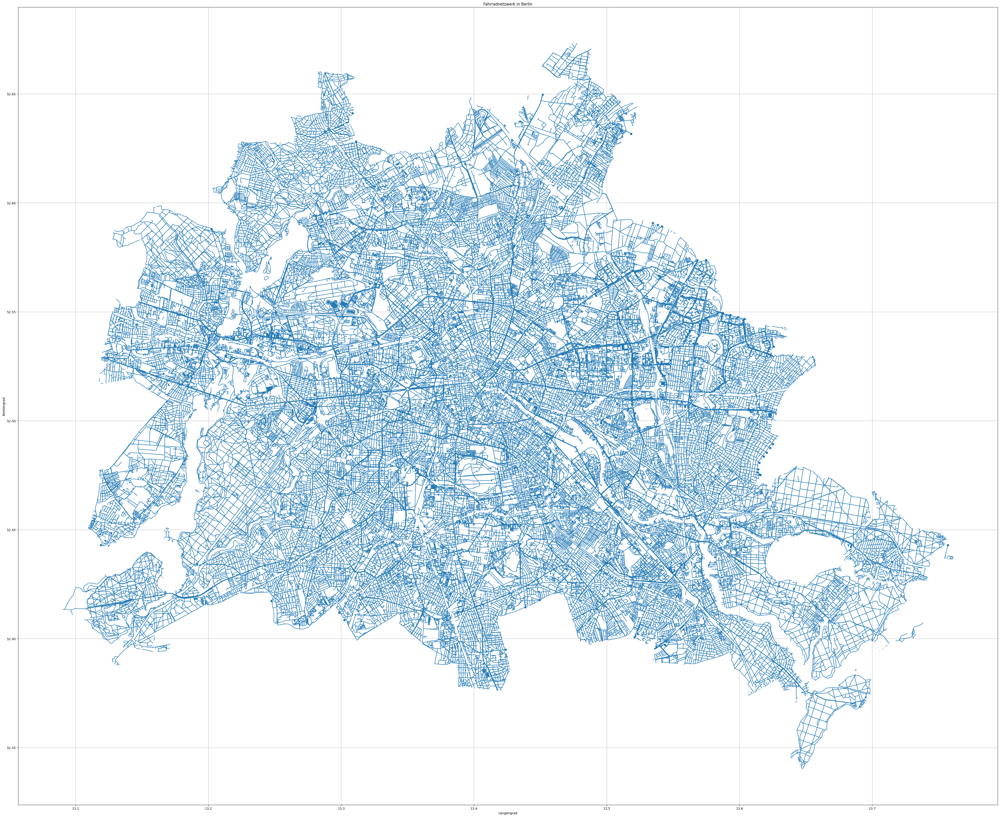

In [32]:
# Zuschnitt auf die Berliner Ausdehnung: Abrufen der administrativen Grenze
boundaries = berlin_osm.get_boundaries(name="Berlin")
berlin_boundary = boundaries[boundaries.name == "Berlin"].reset_index().geometry[0]

# Sicherstellen, dass cycle_net_berlin ein GeoDataFrame ist
cycle_net_berlin = gpd.GeoDataFrame(cycle_net_berlin)

# Zuschnitt des Fahrradnetzwerks auf die Berliner Grenzen
cycle_net_berlin_clipped = gpd.clip(cycle_net_berlin, berlin_boundary)

# Größe des Plots ändern
fig, ax = plt.subplots(figsize=(55, 55))  # Größe des Plots in Zoll

# Plotten des zugeschnittenen Fahrradnetzwerks
cycle_net_berlin_clipped.plot(ax=ax)

# Zusätzliche Plot-Anpassungen
plt.title("Fahrradnetzwerk in Berlin")
plt.xlabel("Längengrad")
plt.ylabel("Breitengrad")
plt.grid(True)

# Plot anzeigen
plt.show()

# 

# 